Testfil

In [10]:
import csv
import os

#f = open("temperatur_trykk_met_samme_rune_time_datasett.csv", "r")
#f = open(r"temperatur_trykk_met_samme_rune_time_datasett.csv","r")
f = open(r"C:\Users\filip\OneDrive - Universitetet i Stavanger\1st semester\Dat120\øving\6\Dat120-ving-6-Gruppeprosjekt-del-1\temperatur_trykk_met_samme_rune_time_datasett.csv")
#f.readline()

if os.path.exists(f):
    print("File found!")

#skal gi 
#Sola;SN44560;11.06.2021 01:00;16,1;1013,7

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\filip\\OneDrive - Universitetet i Stavanger\\1st semester\\Dat120\\øving\\6\\Dat120-ving-6-Gruppeprosjekt-del-1\\temperatur_trykk_met_samme_rune_time_datasett.csv'

In [12]:
import os
print(os.getcwd())
#jamen hva faen 

#OH MY FUCK DET ER EN .CSV.TXT FIL
#HVA FAEN

#trykk_og_temperaturlogg_rune_time.csv.txt

c:\Users\filip\OneDrive - Universitetet i Stavanger\1st semester\Dat120\øving\6\Dat120-ving-6-Gruppeprosjekt-del-1


In [ ]:

rune_temp     = [] 
sola_temp     = []

sola = open("temperatur_trykk_met_samme_rune_time_datasett.csv", "r")
rune = open("trykk_og_temperaturlogg_rune_time.csv.txt", "r")
rune_reader = csv.reader(rune, delimiter=';')
sola_reader = csv.reader(sola, delimiter=';')




In [4]:
import csv
import pandas as pd
import matplotlib.pyplot as plt

class RuneData:
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.data = pd.DataFrame(columns=['datetime', 'trykk_bar', 'trykk_abs', 'temperatur'])
        self.LesData()

    def LesData(self):
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            rows = []
            for row in reader:
                if "Dato" not in row[0]:  # Skip header
                    # Parse the datetime column and append the relevant data
                    datetime_value = pd.to_datetime(row[0], format='%d.%m.%Y %H:%M')
                    rows.append([datetime_value, float(row[2].replace(",", ".")), float(row[3].replace(",", ".")), float(row[4].replace(",", "."))])
            self.data = pd.DataFrame(rows, columns=['datetime', 'trykk_bar', 'trykk_abs', 'temperatur'])

    def get_data(self):
        return self.data


class SolaData:
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.data = pd.DataFrame(columns=['datetime', 'trykk', 'temp'])
        self.LesData()

    def LesData(self):
        with open(self.filnavn) as data_sola:
            reader = csv.reader(data_sola, delimiter=';')
            rows = []
            for row in reader:
                if "Navn" not in row[0]:  # Skip header
                    # Parse the datetime column and append the relevant data
                    datetime_value = pd.to_datetime(row[2], format='%d.%m.%Y %H:%M')
                    rows.append([datetime_value, float(row[4].replace(",", ".")), float(row[3].replace(",", "."))])
            self.data = pd.DataFrame(rows, columns=['datetime', 'trykk', 'temp'])

    def get_data(self):
        return self.data


def interpolate_data(shorter_df, longer_df):
    """
    Interpolate the shorter dataset to match the timestamps of the longer dataset.
    """
    # Set 'datetime' as the index for interpolation
    shorter_df.set_index('datetime', inplace=True)
    longer_df.set_index('datetime', inplace=True)
    
    # Reindex the shorter dataset using the timestamps from the longer dataset
    shorter_interpolated = shorter_df.reindex(longer_df.index).interpolate(method='time')
    
    return shorter_interpolated

# Example usage:

# Load RuneData and SolaData
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')  # Replace with the actual file path for file 2
sola_data = SolaData('temperatur_trykk_met_samme_rune_time_datasett.csv.txt')  # Replace with the actual file path for file 1

# Get data from the classes
rune_df = rune_data.get_data()
sola_df = sola_data.get_data()

# Interpolate the shorter SolaData to match RuneData's timestamps
sola_interpolated = interpolate_data(sola_df, rune_df)

# Now both datasets have the same length and aligned timestamps
print(sola_interpolated.head())

# Plotting the interpolated data against the original RuneData
plt.plot(rune_df.index, rune_df['trykk_bar'], label='Rune Pressure (Bar)')
plt.plot(sola_interpolated.index, sola_interpolated['trykk'], label='Sola Pressure (Interpolated)', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Pressure')
plt.legend()
plt.show()


ValueError: could not convert string to float: ''

                     trykk  temp
datetime                        
2021-11-06 14:23:00    NaN   NaN
2021-11-06 14:23:00    NaN   NaN
2021-11-06 14:23:00    NaN   NaN
2021-11-06 14:23:00    NaN   NaN
2021-11-06 14:23:00    NaN   NaN


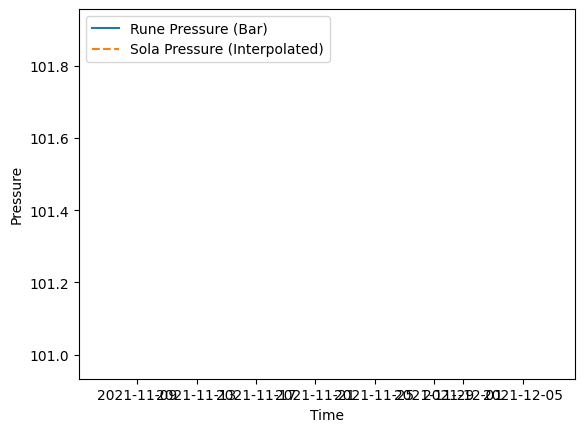

In [7]:
import csv
import pandas as pd
import matplotlib.pyplot as plt

class RuneData:
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.data = pd.DataFrame(columns=['datetime', 'trykk_bar', 'trykk_abs', 'temperatur'])
        self.LesData()

    def LesData(self):
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            rows = []
            for row in reader:
                if "Dato" not in row[0] and "am" not in row[0] and "pm" not in row[0]:  # Skip header
                    try:
                        # Parse the datetime column
                        datetime_value = pd.to_datetime(row[0], format='%d.%m.%Y %H:%M')
                        
                        # Handle missing values by checking if each field is non-empty
                        trykk_bar = float(row[2].replace(",", ".")) if row[2] else None
                        trykk_abs = float(row[3].replace(",", ".")) if row[3] else None
                        temperatur = float(row[4].replace(",", ".")) if row[4] else None

                        rows.append([datetime_value, trykk_bar, trykk_abs, temperatur])
                    except ValueError as e:
                        # Handle row-specific errors (e.g., malformed datetime or float conversion)
                        print(f"Skipping row due to error: {e}")
            self.data = pd.DataFrame(rows, columns=['datetime', 'trykk_bar', 'trykk_abs', 'temperatur'])

    def get_data(self):
        return self.data


class SolaData:
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.data = pd.DataFrame(columns=['datetime', 'trykk', 'temp'])
        self.LesData()

    def LesData(self):
        with open(self.filnavn) as data_sola:
            reader = csv.reader(data_sola, delimiter=';')
            rows = []
            for row in reader:
                if "Navn" not in row[0] and "am" not in row[0] and "pm" not in row[0]:  # Skip header
                    try:
                        # Parse the datetime column
                        datetime_value = pd.to_datetime(row[2], format='%d.%m.%Y %H:%M')
                        
                        # Handle missing values
                        trykk = float(row[4].replace(",", ".")) if row[4] else None
                        temp = float(row[3].replace(",", ".")) if row[3] else None

                        rows.append([datetime_value, trykk, temp])
                    except ValueError as e:
                        print(f"Skipping row due to error: {e}")
            self.data = pd.DataFrame(rows, columns=['datetime', 'trykk', 'temp'])

    def get_data(self):
        return self.data


def interpolate_data(shorter_df, longer_df):
    """
    Interpolate the shorter dataset to match the timestamps of the longer dataset.
    """
    # Set 'datetime' as the index for interpolation
    shorter_df.set_index('datetime', inplace=True)
    longer_df.set_index('datetime', inplace=True)
    
    # Reindex the shorter dataset using the timestamps from the longer dataset
    shorter_interpolated = shorter_df.reindex(longer_df.index).interpolate(method='time')
    
    return shorter_interpolated

# Example usage:

# Load RuneData and SolaData
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')  # Replace with the actual file path for file 2
sola_data = SolaData('temperatur_trykk_met_samme_rune_time_datasett.csv.txt')  # Replace with the actual file path for file 1

# Get data from the classes
rune_df = rune_data.get_data()
sola_df = sola_data.get_data()

# Interpolate the shorter SolaData to match RuneData's timestamps
sola_interpolated = interpolate_data(sola_df, rune_df)

# Now both datasets have the same length and aligned timestamps
print(sola_interpolated.head())

# Plotting the interpolated data against the original RuneData
plt.plot(rune_df.index, rune_df['trykk_bar'], label='Rune Pressure (Bar)')
plt.plot(sola_interpolated.index, sola_interpolated['trykk'], label='Sola Pressure (Interpolated)', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Pressure')
plt.legend()
plt.show()


In [8]:
#Class_access_files

import csv

class SolaData: 
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.tid     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):  # enumerate(reader) gir både indeksen (int) i og row-listen fra reader.
                    if "Navn" not in row[0] and "Data" not in row[0]: #for å skippe forklarings linja
                        for j in range(360):
                            self.tid  .append(j)
                            self.temp .append(row[3])
                            self.trykk.append(row[4])                

    def solaTid(self):
        return self.tid

    def solaTrykk(self):
        return self.trykk

    def solaTrykkAbs(self):
        return self.trykk
    
# en class er bare en funksjon med funksjoner inni
class RuneData:
    #self er bare et vanlig variabelnavn, basically det det gjør er å call-e på seg selv. forklaring under
    def __init__(self, filnavn): #init betyr initialize, altså "start med:" så hver gang du vil hente noe fra klassen så gjør den følgende operasjoner:
        self.filnavn    = filnavn
        #står egentlig "RuneData skal starte med å fortelle seg selv at den skal bruke variabelen filnavn når enn filnavn blir nevnet senere" 
        self.tid        = []
        self.trykk_bar  = []
        self.trykk_abs  = []
        self.temparatur = []
        self.LesData()  
        #så må du manuelt spør om resten av koden

    def LesData(self):
        # Åpner og leser rune sin fil:
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            for row in reader:
                if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0]:
                    self.tid       .append(row[1])
                    self.trykk_bar .append(row[2])
                    self.trykk_abs .append(row[3])
                    self.temparatur.append(row[4])
                else: 
                    self.tid       .append(row[1])
                    self.trykk_bar .append(0)
                    self.trykk_abs .append(0)
                    self.temparatur.append(0)
                sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
                solatid = sola_data.solaTid()
               
                for i in range(len(solatid) - len(self.tid)):
                    if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0]: 
                        self.tid       .append(int(self.tid[-1])+10)
                        self.trykk_bar .append(0)
                        self.trykk_abs .append(0)
                        self.temparatur.append(0)

    #Disse funksjonene returnerer da listene vi ser etter, hvis ikke så bare eksisterer de tomt
    #skal forklare senere hvordan vi får tak i de
    def runeTemp(self):
        return self.temparatur
    
    def runeTid(self):
        return self.tid

    def runeTrykkBar(self):
        return self.trykk_bar

    def runeTrykkAbs(self):
        return self.trykk_abs
    


# Create an instance of the class
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
# Access data
solatid = sola_data.solaTid()
ruetid = rune_data.runeTid()

print(len(ruetid))
print(len(solatid))

KeyboardInterrupt: 

In [9]:
#Class_access_files

import csv

class SolaData: 
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.time     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):  # enumerate(reader) gir både indeksen (int) i og row-listen fra reader.
                    if "Navn" not in row[0] and "Data" not in row[0]: #for å skippe forklarings linja
                        for j in range(360):
                            self.time .append(j)
                            self.temp .append(row[3])
                            self.trykk.append(row[4])                

    def solaTid(self):
        return self.time

    def solaTrykk(self):
        return self.trykk

    def solaTrykkAbs(self):
        return self.trykk
    
# en class er bare en funksjon med funksjoner inni
class RuneData:
    #self er bare et vanlig variabelnavn, basically det det gjør er å call-e på seg selv. forklaring under
    def __init__(self, filnavn): #init betyr initialize, altså "start med:" så hver gang du vil hente noe fra klassen så gjør den følgende operasjoner:
        self.filnavn    = filnavn
        #står egentlig "RuneData skal starte med å fortelle seg selv at den skal bruke variabelen filnavn når enn filnavn blir nevnet senere" 
        self.tid        = []
        self.trykk_bar  = []
        self.trykk_abs  = []
        self.temparatur = []
        self.LesData()  
        #så må du manuelt spør om resten av koden

    def LesData(self):
        # Åpner og leser rune sin fil:
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            for row in reader:
                if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0]:
                    self.tid       .append(row[1])
                    self.trykk_bar .append(row[2])
                    self.trykk_abs .append(row[3])
                    self.temparatur.append(row[4])
                else: 
                    self.tid       .append(row[1])
                    self.trykk_bar .append(0)
                    self.trykk_abs .append(0)
                    self.temparatur.append(0)
                sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
                solatid = sola_data.solaTid()
                           
                for i in range(len(solatid) - len(self.tid)):
                    if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0]: 
                        self.tid       .append(int(self.tid[-1])+10)
                        self.trykk_bar .append(0)
                        self.trykk_abs .append(0)
                        self.temparatur.append(0)
                        print(self.tid[-1])

    #Disse funksjonene returnerer da listene vi ser etter, hvis ikke så bare eksisterer de tomt
    #skal forklare senere hvordan vi får tak i de
    def runeTemp(self):
        return self.temparatur
    
    def runeTid(self):
        return self.tid

    def runeTrykkBar(self):
        return self.trykk_bar

    def runeTrykkAbs(self):
        return self.trykk_abs
    


# Create an instance of the class
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
# Access data
solatid = sola_data.solaTid()
ruetid = rune_data.runeTid()

print(len(ruetid))
print(len(solatid))

10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490
1500
1510
1520
1530
1540
1550
1560
1570
1580
1590
1600
1610
1620
1630
1640
1650
1660
1670
1680
1690
1700
1710
1720
1730
1740
1750
1760
1770
1780
1790
1800
1810
1820
1830
1840
1850
1860
1870
1880
1890
1900
1910
1920
1930
1940
1950
1960
1970
1980
1990
2000
2010
2020
2030
2040
2050
2060
2070
2080
2090
2100
2110
2120
2130
2140
2150
2160
2170
2180
2190
2200
2210
222

KeyboardInterrupt: 

In [6]:
#Class_access_files

import csv

class SolaData: 
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.time     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):  # enumerate(reader) gir både indeksen (int) i og row-listen fra reader.
                if "Navn" not in row[0] and "Data" not in row[0]: #for å skippe forklarings linja
                    for j in range(360):
                        self.time .append(j)
                        self.temp .append(row[3])
                        self.trykk.append(row[4])                

    def solaTid(self):
        return self.time

    def solaTrykk(self):
        return self.trykk

    def solaTrykkAbs(self):
        return self.trykk
    
# en class er bare en funksjon med funksjoner inni
class RuneData:
    #self er bare et vanlig variabelnavn, basically det det gjør er å call-e på seg selv. forklaring under
    def __init__(self, filnavn): #init betyr initialize, altså "start med:" så hver gang du vil hente noe fra klassen så gjør den følgende operasjoner:
        self.filnavn    = filnavn
        #står egentlig "RuneData skal starte med å fortelle seg selv at den skal bruke variabelen filnavn når enn filnavn blir nevnet senere" 
        self.tid        = []
        self.trykk_bar  = []
        self.trykk_abs  = []
        self.temparatur = []
        self.LesData()  
        #så må du manuelt spør om resten av koden

    def LesData(self):
        # Åpner og leser rune sin fil:
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            for row in reader:
                if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0]:
                    self.tid       .append(row[1])
                    self.trykk_bar .append(row[2])
                    self.trykk_abs .append(row[3])
                    self.temparatur.append(row[4])
                else: 
                    self.tid       .append(row[1])
                    self.trykk_bar .append(0)
                    self.trykk_abs .append(0)
                    self.temparatur.append(0)
                sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
                solatid = sola_data.solaTid()
                           
                for i in range(len(solatid) - len(self.tid)):
                    if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0]: 
                        self.tid       .append(int(self.tid[-1])+10)
                        self.trykk_bar .append(0)
                        self.trykk_abs .append(0)
                        self.temparatur.append(0)

    #Disse funksjonene returnerer da listene vi ser etter, hvis ikke så bare eksisterer de tomt
    #skal forklare senere hvordan vi får tak i de
    def runeTemp(self):
        return self.temparatur
    
    def runeTid(self):
        return self.tid

    def runeTrykkBar(self):
        return self.trykk_bar

    def runeTrykkAbs(self):
        return self.trykk_abs
    


# Create an instance of the class
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
# Access data
solatid = sola_data.solaTid()
sola_temp = sola_data.solaTrykk()
ruetid = rune_data.runeTid()




KeyboardInterrupt: 

In [17]:
class SolaData: 
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.time     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):  # enumerate(reader) gir både indeksen (int) i og row-listen fra reader.
                if "Navn" not in row[0] and "Data" not in row[0] and "/" not in row[2]:  # Skip date formats with '/'
                    trykk_value = row[4]
                    temp_value = row[3]
                    for j in range(360):
                        self.time.append(j)         # appending time (if you want j as the time values)
                        self.temp.append(temp_value.replace(',', '.'))  # appending the temperature 360 times
                        self.trykk.append(trykk_value.replace(',', '.'))             



    def solaTid(self):
        return self.time

    def solaTrykk(self):
        return self.trykk

    def solaTemp(self):
        return self.temp

class RuneData:
    def __init__(self, filnavn):
        self.filnavn    = filnavn
        self.tid        = []
        self.trykk_bar  = []
        self.trykk_abs  = []
        self.temparatur = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            for row in reader:
                if "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0] and "/" not in row[0]:
                    self.tid.append(row[1])  # Store time since start
                    self.trykk_bar.append(row[2].replace(',', '.'))
                    self.trykk_abs.append(row[3].replace(',', '.'))
                    self.temparatur.append(row[4].replace(',', '.'))
                
    def runeTemp(self):
        return self.temparatur

    def runeTid(self):
        return self.tid

    def runeTrykkBar(self):
        return self.trykk_bar

    def runeTrykkAbs(self):
        return self.trykk_abs

rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")

# Now both lists should have the same length
sola_time = sola_data.solaTid()
rune_time = rune_data.runeTid()
sola_temp = sola_data.solaTemp()
rune_temp = rune_data.runeTemp()

import matplotlib.pyplot as plt


plt.plot(rune_time, rune_temp, label="rune temperatur i c" )
plt.plot(sola_time, sola_temp, label="sola temperatur i c")


plt.grid()
plt.legend()
plt.show()




25920
12098


In [9]:
import csv

class SolaData: 
    def __init__(self, filnavn):
        self.filnavn = filnavn
        self.time     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):  # enumerate(reader) gir både indeksen (int) i og row-listen fra reader.
                if "Navn" not in row[0] and "Data" not in row[0]:  # Skip explanation rows
                    temp_value = row[3]
                    trykk_value = row[4]
                    for j in range(360):
                        self.time.append(j)         
                        self.temp.append(temp_value) 
                        self.trykk.append(trykk_value)             

    def solaTid(self):
        return self.time

    def solaTrykk(self):
        return self.trykk

    def solaTrykkAbs(self):
        return self.trykk
    
    # Create an instance of the class
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")
# Access data
solatid = sola_data.solaTid()
ruetid = rune_data.runeTid()



16,1
16
16
15,9
16,3
15,8
15,8
15,9
16,1
16,5
17
16,2
15,8
16,4
15,8
16,2
15,5
15,1
14,7
13,8
13,1
13,2
12,4
12,2
12,1
11,8
11,8
12,1
12,3
12,5
12,3
12,3
13,4
13,4
13,5
14,4
13,7
14,1
13,8
13,8
12,5
12,3
12,4
11,5
11,8
12
11,8
11,5
11,9
11,5
10,8
10,9
11,2
11,6
12,2
12,8
13,3
13,4
13,5
14,3
14,4
14,5
14,3
14,5
14,9
13,7
13,9
14,1
13,8
13,9
14,2
14,5
16,1
16
16
15,9
16,3
15,8
15,8
15,9
16,1
16,5
17
16,2
15,8
16,4
15,8
16,2
15,5
15,1
14,7
13,8
13,1
13,2
12,4
12,2
12,1
11,8
11,8
12,1
12,3
12,5
12,3
12,3
13,4
13,4
13,5
14,4
13,7
14,1
13,8
13,8
12,5
12,3
12,4
11,5
11,8
12
11,8
11,5
11,9
11,5
10,8
10,9
11,2
11,6
12,2
12,8
13,3
13,4
13,5
14,3
14,4
14,5
14,3
14,5
14,9
13,7
13,9
14,1
13,8
13,9
14,2
14,5
16,1
16
16
15,9
16,3
15,8
15,8
15,9
16,1
16,5
17
16,2
15,8
16,4
15,8
16,2
15,5
15,1
14,7
13,8
13,1
13,2
12,4
12,2
12,1
11,8
11,8
12,1
12,3
12,5
12,3
12,3
13,4
13,4
13,5
14,4
13,7
14,1
13,8
13,8
12,5
12,3
12,4
11,5
11,8
12
11,8
11,5
11,9
11,5
10,8
10,9
11,2
11,6
12,2
12,8
13,3
13,4
13,5
14,3
14,4

KeyboardInterrupt: 

Skipping row 0 due to insufficient columns: ['Dato og tid', 'Tid siden start (sek)', 'Trykk - barometer (bar)', 'Trykk - absolutt trykk maaler (bar)', 'Temperatur (gr Celsius)']
Skipping row 12099 due to insufficient columns: ['06/13/2021 00:00:08 am', '121020', '101,91', '101,3', '11,51']
Skipping row 12100 due to insufficient columns: ['06/13/2021 00:00:18 am', '121030', '', '101,283', '11,47']
Skipping row 12101 due to insufficient columns: ['06/13/2021 00:00:28 am', '121040', '', '101,335', '11,47']
Skipping row 12102 due to insufficient columns: ['06/13/2021 00:00:38 am', '121050', '', '101,283', '11,48']
Skipping row 12103 due to insufficient columns: ['06/13/2021 00:00:48 am', '121060', '', '101,313', '11,48']
Skipping row 12104 due to insufficient columns: ['06/13/2021 00:00:58 am', '121070', '', '101,274', '11,52']
Skipping row 12105 due to insufficient columns: ['06/13/2021 00:01:08 am', '121080', '101,91', '101,311', '11,53']
Skipping row 12106 due to insufficient columns: [

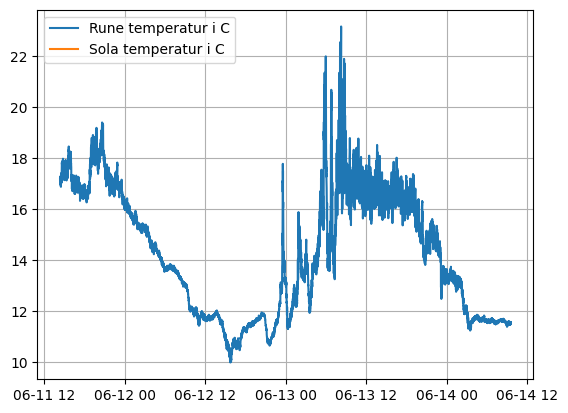

In [6]:
import csv
import datetime as dt
import matplotlib.pyplot as plt

class SolaData: 
    def __init__(self, filnavn): 
        self.filnavn = filnavn
        self.time     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):
                # Ensure that the row has enough columns
                if len(row) >= 5 and "Navn" not in row[0] and "Data" not in row[0] and "/" not in row[2]:
                    try:
                        # Extract main time string and seconds offset
                        time_str = row[0].split(' ')[0] + ' ' + row[0].split(' ')[1]
                        seconds_offset = int(row[1])

                        # Parse the main datetime string
                        base_time = dt.datetime.strptime(time_str, "%d.%m.%Y %H:%M")

                        # Add the seconds offset
                        time_obj = base_time + dt.timedelta(seconds=seconds_offset)
                        self.time.append(time_obj)

                        # Check if the values are not empty before converting to float
                        trykk_value = row[4].replace(',', '.') if row[4] else None
                        temp_value = row[3].replace(',', '.') if row[3] else None

                        # Only append if values are not empty
                        if temp_value:
                            self.temp.append(float(temp_value)) 
                        else:
                            self.temp.append(None)

                        if trykk_value:
                            self.trykk.append(float(trykk_value))
                        else:
                            self.trykk.append(None)
                            
                    except Exception as e:
                        print(f"Error processing row {i}: {e}")
                else:
                    print(f"Skipping row {i} due to insufficient columns: {row}")

class RuneData:
    def __init__(self, filnavn):
        self.filnavn    = filnavn
        self.tid        = []
        self.trykk_bar  = []
        self.trykk_abs  = []
        self.temparatur = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            for i, row in enumerate(reader):
                # Ensure that the row has enough columns
                if len(row) >= 5 and "am" not in row[0] and "pm" not in row[0] and "Dato" not in row[0] and "/" not in row[0]:
                    try:
                        # Extract main time string and seconds offset
                        time_str = row[0]
                        seconds_offset = int(row[1])
                        
                        # Parse the main datetime string
                        base_time = dt.datetime.strptime(time_str, "%m.%d.%Y %H:%M")

                        # Add the seconds offset
                        time_obj = base_time + dt.timedelta(seconds=seconds_offset)
                        self.tid.append(time_obj)

                        # Check if the values are not empty before converting to float
                        trykk_bar_value = row[2].replace(',', '.') if row[2] else None
                        trykk_abs_value = row[3].replace(',', '.') if row[3] else None
                        temp_value = row[4].replace(',', '.') if row[4] else None

                        # Append values only if they are not empty
                        if trykk_bar_value:
                            self.trykk_bar.append(float(trykk_bar_value))
                        else:
                            self.trykk_bar.append(None)

                        if trykk_abs_value:
                            self.trykk_abs.append(float(trykk_abs_value))
                        else:
                            self.trykk_abs.append(None)

                        if temp_value:
                            self.temparatur.append(float(temp_value))
                        else:
                            self.temparatur.append(None)

                    except Exception as e:
                        print(f"Error processing row {i}: {e}")
                else:
                    print(f"Skipping row {i} due to insufficient columns: {row}")

# Load data
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")

# Plot data
# Filter out None values before plotting
plt.plot([t for t, temp in zip(rune_data.tid, rune_data.temparatur) if temp is not None],
         [temp for temp in rune_data.temparatur if temp is not None], label="Rune temperatur i C")
plt.plot([t for t, temp in zip(sola_data.time, sola_data.temp) if temp is not None],
         [temp for temp in sola_data.temp if temp is not None], label="Sola temperatur i C")

plt.grid()
plt.legend()
plt.show()


Skipping row 0 due to invalid seconds: Tid siden start (sek)
Error processing row 12099: time data '06/13/2021 00:00:08 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12100: time data '06/13/2021 00:00:18 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12101: time data '06/13/2021 00:00:28 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12102: time data '06/13/2021 00:00:38 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12103: time data '06/13/2021 00:00:48 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12104: time data '06/13/2021 00:00:58 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12105: time data '06/13/2021 00:01:08 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12106: time data '06/13/2021 00:01:18 am' does not match format '%m/%d/%Y %I:%M:%S %p'
Error processing row 12107: time data '06/13/2021 00:01:28 am' does not mat

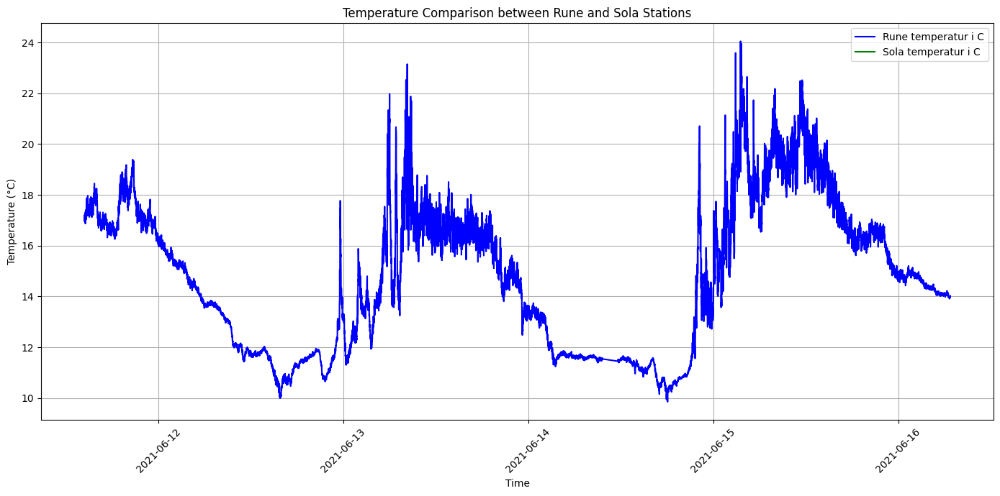

In [11]:
import csv
import datetime as dt
import matplotlib.pyplot as plt

class SolaData: 
    def __init__(self, filnavn): 
        self.filnavn = filnavn
        self.time     = []
        self.trykk   = []
        self.temp    = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_Sola:
            reader = csv.reader(data_Sola, delimiter=';')
            for i, row in enumerate(reader):
                if len(row) >= 5:
                    try:
                        time_str = row[0]
                        
                        # Validate and convert the seconds offset, skip if invalid
                        try:
                            seconds_offset = int(row[1])  # This needs to be a valid integer
                        except ValueError:
                            print(f"Skipping row {i} due to invalid seconds: {row[1]}")
                            continue

                        # Parse the datetime considering 12-hour format
                        if 'am' in time_str.lower() or 'pm' in time_str.lower():
                            base_time = dt.datetime.strptime(time_str, "%m/%d/%Y %I:%M:%S %p")
                        else:
                            # Expecting the Sola data format with periods
                            base_time = dt.datetime.strptime(time_str, "%m.%d.%Y %H:%M")
                        
                        # Add the seconds offset
                        time_obj = base_time + dt.timedelta(seconds=seconds_offset)
                        self.time.append(time_obj)

                        # Process temperature and pressure values
                        trykk_value = row[4].replace(',', '.') if row[4] else None
                        temp_value = row[3].replace(',', '.') if row[3] else None

                        # Only append if values are not empty
                        if temp_value:
                            self.temp.append(float(temp_value)) 
                        else:
                            self.temp.append(None)

                        if trykk_value:
                            self.trykk.append(float(trykk_value))
                        else:
                            self.trykk.append(None)
                            
                    except Exception as e:
                        print(f"Error processing row {i}: {e}")
                else:
                    print(f"Skipping row {i} due to insufficient columns: {row}")

class RuneData:
    def __init__(self, filnavn):
        self.filnavn    = filnavn
        self.tid        = []
        self.trykk_bar  = []
        self.trykk_abs  = []
        self.temparatur = []
        self.LesData()  

    def LesData(self):
        with open(self.filnavn) as data_rune:
            reader = csv.reader(data_rune, delimiter=';')
            for i, row in enumerate(reader):
                # Ensure that the row has enough columns
                if len(row) >= 5:
                    try:
                        time_str = row[0]

                        # Validate and convert the seconds offset, skip if invalid
                        try:
                            seconds_offset = int(row[1])
                        except ValueError:
                            print(f"Skipping row {i} due to invalid seconds: {row[1]}")
                            continue
                        
                        # Detect if AM/PM is present in the time and use the appropriate format
                        if 'am' in time_str.lower() or 'pm' in time_str.lower():
                            base_time = dt.datetime.strptime(time_str, "%m/%d/%Y %I:%M:%S %p")
                        else:
                            # Expecting the Rune data format
                            base_time = dt.datetime.strptime(time_str, "%m.%d.%Y %H:%M")

                        # Add the seconds offset
                        time_obj = base_time + dt.timedelta(seconds=seconds_offset)
                        self.tid.append(time_obj)

                        # Check if the values are not empty before converting to float
                        trykk_bar_value = row[2].replace(',', '.') if row[2] else None
                        trykk_abs_value = row[3].replace(',', '.') if row[3] else None
                        temp_value = row[4].replace(',', '.') if row[4] else None

                        # Append values only if they are not empty
                        if trykk_bar_value:
                            self.trykk_bar.append(float(trykk_bar_value))
                        else:
                            self.trykk_bar.append(None)

                        if trykk_abs_value:
                            self.trykk_abs.append(float(trykk_abs_value))
                        else:
                            self.trykk_abs.append(None)

                        if temp_value:
                            self.temparatur.append(float(temp_value))
                        else:
                            self.temparatur.append(None)

                    except Exception as e:
                        print(f"Error processing row {i}: {e}")
                else:
                    print(f"Skipping row {i} due to insufficient columns: {row}")

# Load data
rune_data = RuneData('trykk_og_temperaturlogg_rune_time.csv.txt')
sola_data = SolaData("temperatur_trykk_met_samme_rune_time_datasett.csv.txt")

# Check if data exists for plotting
if not sola_data.time or not sola_data.temp:
    print("No data found for Sola.")
if not rune_data.tid or not rune_data.temparatur:
    print("No data found for Rune.")

# Plot data
# Filter out None values before plotting
plt.figure(figsize=(14, 7))  # Increase figure size for better visibility

# Plot Rune data
rune_times = [t for t, temp in zip(rune_data.tid, rune_data.temparatur) if temp is not None]
rune_temps = [temp for temp in rune_data.temparatur if temp is not None]
plt.plot(rune_times, rune_temps, label="Rune temperatur i C", color='blue')

# Plot Sola data
sola_times = [t for t, temp in zip(sola_data.time, sola_data.temp) if temp is not None]
sola_temps = [temp for temp in sola_data.temp if temp is not None]
plt.plot(sola_times, sola_temps, label="Sola temperatur i C", color='green')

plt.grid()
plt.legend()
plt.xlabel("Time")
plt.ylabel("Temperature (°C)")
plt.title("Temperature Comparison between Rune and Sola Stations")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
